To run the notebook, you'd need to install the libraries and packages mentioned in requirements.txt file. Either run `pip install -r requirements.txt` or go through the file and install them through pip manually eg. `pip install bertopic==0.8.1` and so on.

In [78]:
import joblib
import plotly
import pandas as pd
from bertopic import BERTopic

import matplotlib
from umap import UMAP
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS

In [2]:
data = pd.read_csv('./Customer Complaints.csv')
data = data.iloc[: , 1:]
data = data[data['narrative'] != 'name']
data = data[data['narrative'].notna()]
data.drop_duplicates(inplace=True)
data.reset_index(inplace=True)
print(data.shape)

(124618, 3)


In [52]:
df = data
df.head()

,index,product,narrative
0,0,Transaction Processing,purchase order day shipping amount receive pro...
1,1,Transaction Processing,forwarded message date tue subject please inve...
2,2,retail_banking,forwarded message cc sent friday pdt subject f...
3,3,Transaction Processing,payment history missing credit report speciali...
4,4,Transaction Processing,payment history missing credit report made mis...


In [4]:
print(df['product'].value_counts())
counts = df['product'].value_counts().values

Transaction Processing    71293
debt_collection           39852
retail_banking            13473
Name: product, dtype: int64


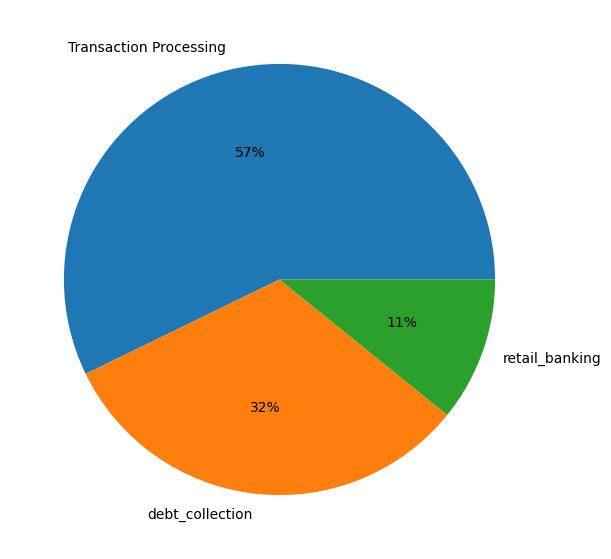

In [5]:
# Creating dataset
product = ['Transaction Processing', 'debt_collection', 'retail_banking']
  
# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(counts, labels = product, autopct='%1.0f%%')
  
# show plot
plt.show()

In [50]:
plt.rcParams["figure.figsize"] = [20, 20]
plt.rcParams['figure.dpi'] = 400
plotly.offline.init_notebook_mode()

Looking at the pie-chart above, we can see that majority of the complaints have been related to Transaction Processing. Fewest complaints were recieved for retail_banking.

For each of the different products, we will try and determine what were the major points of complaints from the customers. For this, we will use BERT for topic modelling and for each of the topics generated, we will look at how each of the topic is distributed. For topic modelling using BERT, we use a library called [BERTopic](https://maartengr.github.io/BERTopic/tutorial/algorithm/algorithm.html). BERTopic uses concepts of BERT, class TFIDF and HDBScan to generate relevant topics for a given data.

## Retail Banking

In [53]:
df_RB = df[df['product'] == 'retail_banking']
df_RB.reset_index(inplace=True)

We will first plot a word cloud for the complaints in retail banking. A word cloud (also known as a tag cloud) is a visual representation of words. Cloud creators are used to highlight popular words and phrases based on frequency and relevance. They provide us with quick and simple visual insights that can lead to more in-depth analyses.

In [70]:
comment_words = ""
for i in df_RB.narrative: 
    i = str(i) 
    separate = i.split() 
    for j in range(len(separate)): 
        separate[j] = separate[j].lower() 
      
    comment_words += " ".join(separate)+" "

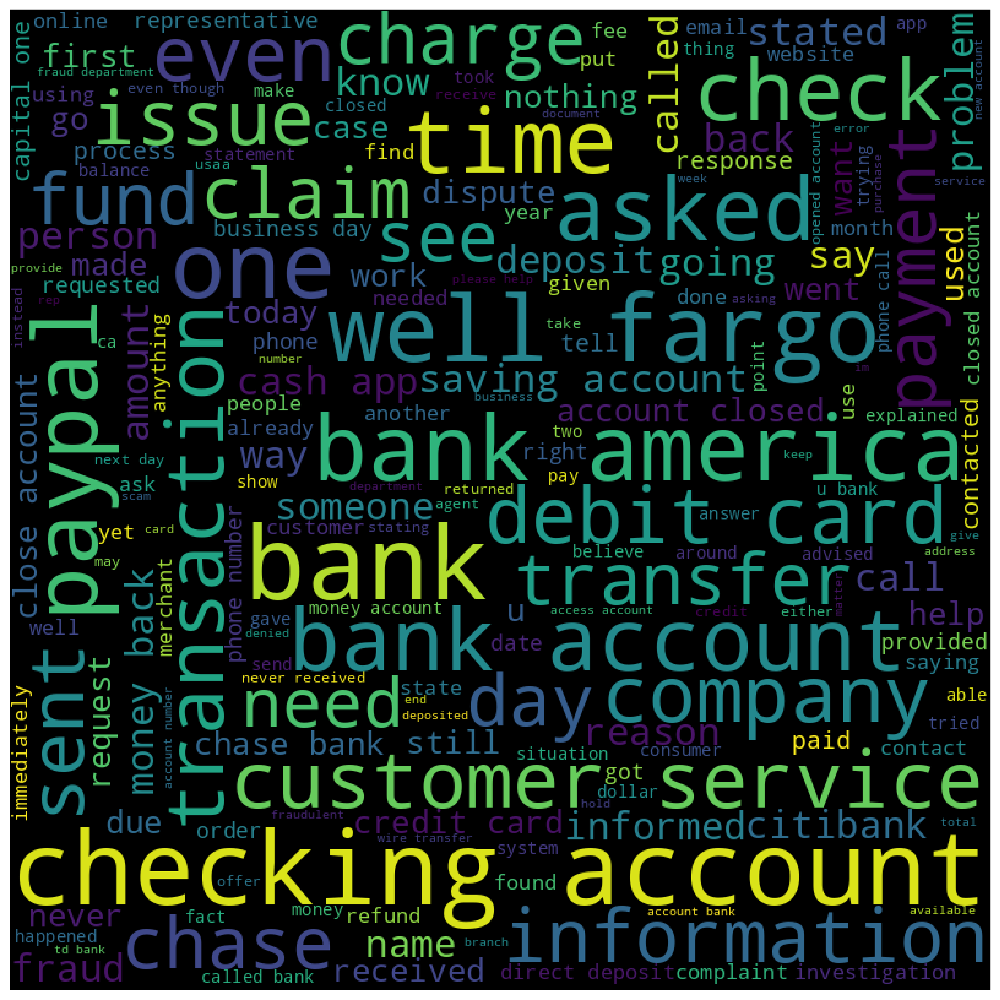

In [85]:
STOPWORDS = list(STOPWORDS)
STOPWORDS.extend(['told', 'said'])

# Creating the Word Cloud
final_wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = STOPWORDS, 
                min_font_size = 10).generate(comment_words)

# Displaying the WordCloud                    
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(final_wordcloud) 
plt.axis("off")
plt.tight_layout(pad = 0) 
  
plt.show()

The worldcloud here shows the most common words that are present in the complaints with the most frequent words being larger in size than the less frequent ones.

Next we will use BERT to generate different topics from the customer complaints for better analyis of the data.

In [7]:
model_RB = BERTopic(n_gram_range=(2, 4), nr_topics=43)
topics_RB, _ = model_RB.fit_transform(df_RB['narrative'])

/home/bikram/anaconda3/envs/alt/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


In [8]:
model_RB.get_topic_freq().head()

,Topic,Count
0,-1,4334
1,0,1075
2,1,747
3,2,699
4,3,499


For Retail Banking, we generate around 43 topics with each topic being represented by an integer. The topic represented by -1 denotes outliers and we can ignore that topic while analyzing the other important topics. By plotting an intertopic distance map, we can visualize and see which topics consists of which keywords and how far apart they are when plotted in a 2-dimensional space. We can observe from the above table that 1096 complaints that are represented by topic 0 are most common for retail banking. Count for a topic represents the number of complaints that belong to the topic. We will take a further look at what kind of complaints are present in topic 0.

In [9]:
model_RB.visualize_topics()

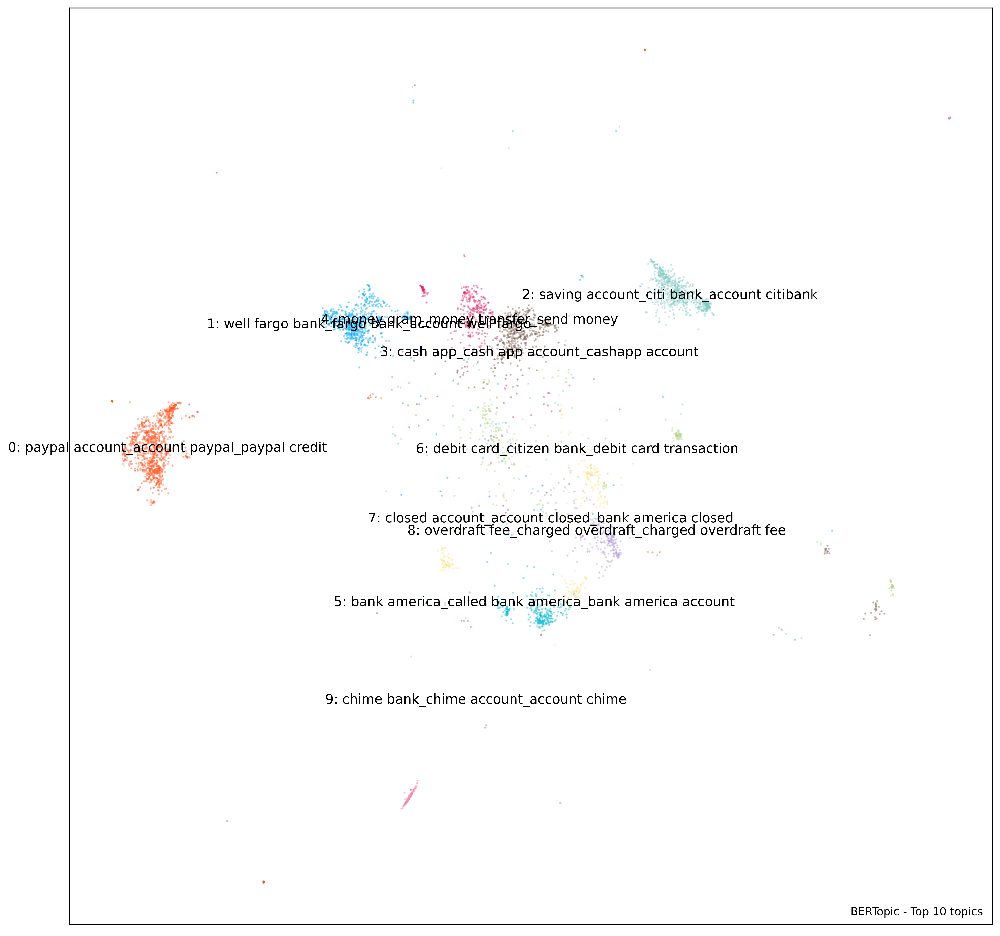

In [41]:
# Prepare data for plotting
embeddings = model_RB._extract_embeddings(df_RB['narrative'], method="document")
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit(embeddings)
df = pd.DataFrame(umap_model.embedding_, columns=["x", "y"])
df["topic"] = topics_RB

# Plot parameters
top_n = 10
fontsize = 12

# Slice data
to_plot = df.copy()
to_plot[df.topic >= top_n] = -1
outliers = to_plot.loc[to_plot.topic == -1]
non_outliers = to_plot.loc[to_plot.topic != -1]

# Visualize topics
cmap = matplotlib.colors.ListedColormap(['#FF5722', # Red
                                         '#03A9F4', # Blue
                                         '#4CAF50', # Green
                                         '#80CBC4', # FFEB3B
                                         '#673AB7', # Purple
                                         '#795548', # Brown
                                         '#E91E63', # Pink
                                         '#212121', # Black
                                         '#00BCD4', # Light Blue
                                         '#CDDC39', # Yellow/Red
                                         '#AED581', # Light Green
                                         '#FFE082', # Light Orange
                                         '#BCAAA4', # Light Brown
                                         '#B39DDB', # Light Purple
                                         '#F48FB1', # Light Pink
                                         ])

# Visualize outliers + inliers
fig, ax = plt.subplots(figsize=(15, 15))
# scatter_outliers = ax.scatter(outliers['x'], outliers['y'], c="#E0E0E0", s=1, alpha=.3)
scatter = ax.scatter(non_outliers['x'], non_outliers['y'], c=non_outliers['topic'], s=1, alpha=.3, cmap=cmap)

# Add topic names to clusters
centroids = to_plot.groupby("topic").mean().reset_index().iloc[1:]
for row in centroids.iterrows():
    topic = int(row[1].topic)
    text = f"{topic}: " + "_".join([x[0] for x in model_RB.get_topic(topic)[:3]])
    ax.text(row[1].x, row[1].y*1.01, text, fontsize=fontsize, horizontalalignment='center')

ax.text(0.99, 0.01, f"BERTopic - Top {top_n} topics", transform=ax.transAxes, horizontalalignment="right", color="black")
plt.xticks([], [])
plt.yticks([], [])
plt.show()

A static 2D visualization of the top 10 topics for Retail Banking is shown above.

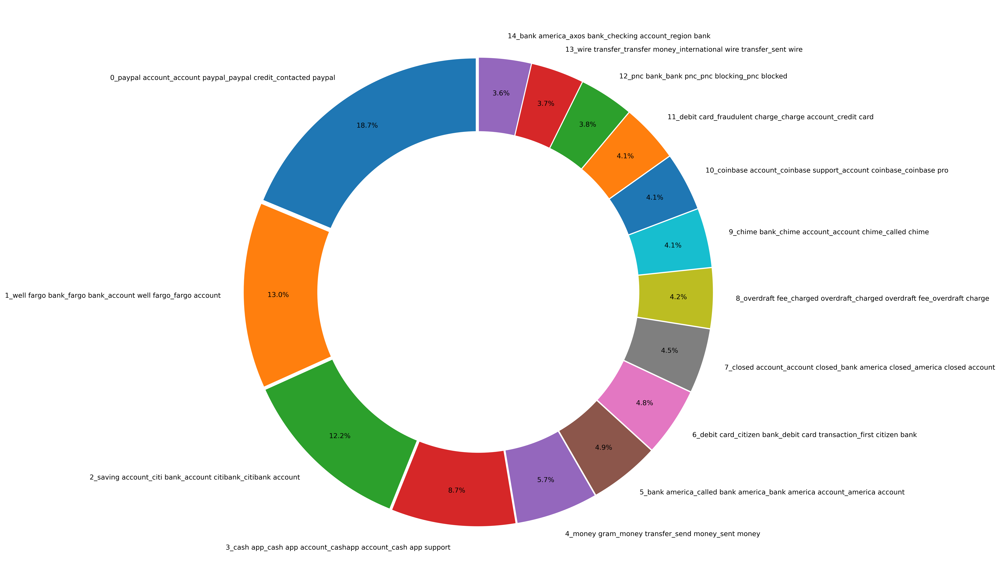

In [10]:
# Pie chart
labels = model_RB.get_topic_info()['Name'].values[1:16]
sizes = model_RB.get_topic_freq()['Count'].values[1:16]
#explsion
explode = [0.02]* len(sizes)
 
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
plt.show()

We plot a pie-chart for the top 15 topics for better analysis. We ignore the rest because we are only looking at the majority of the topics that contribute to customer complaints. *(Open the image in a new tab for better quality).* Some of the keywords representing a particular topic are concatenated together which represents a topic as a whole. The integer at the beginning represents the topic index. From the chart we can see that around **19.3%** of the complaints for Retail Banking are for **Paypal based issues**. It is followed by **Wells Fargo** with around **13.5%** of the complaints. Similarly primary topics for other complaints can be seen (eg. Cash app, Bank of America, etc.) 

For each of the topics we generated with BERTopic, we print out the primary keywords below.

In [11]:
topic_idxs = list(range(0, 43))
counts = model_RB.get_topic_freq()['Count'].values[1:]
for idx,count in zip(topic_idxs, counts):
    kws = model_RB.get_topic(idx)
    print(f"Topic: {idx}\t\t Counts: {count}")
    for kw in kws:
        print('\t', kw[0])
    print()
    print()

Topic: 0		 Counts: 1075
	 paypal account
	 account paypal
	 paypal credit
	 contacted paypal
	 paypal paypal
	 email paypal
	 using paypal
	 contact paypal
	 paypal customer
	 payment paypal


Topic: 1		 Counts: 747
	 well fargo bank
	 fargo bank
	 account well fargo
	 fargo account
	 well fargo account
	 call well fargo
	 fargo customer
	 well fargo customer
	 contacted well fargo
	 fargo claim


Topic: 2		 Counts: 699
	 saving account
	 citi bank
	 account citibank
	 citibank account
	 checking saving
	 checking saving account
	 account citi
	 citi account
	 citibank checking
	 citibank branch


Topic: 3		 Counts: 499
	 cash app
	 cash app account
	 cashapp account
	 cash app support
	 money cash
	 account cash app
	 money cash app
	 contact cash app
	 back cash app
	 email cash app


Topic: 4		 Counts: 327
	 money gram
	 money transfer
	 send money
	 sent money
	 money back
	 called moneygram
	 transfer money
	 receive money
	 money sent
	 get money back


Topic: 5		 Counts: 281
	 b

We put complaints belonging to the same topic in a list with each topic index as the key in a dictionary

In [ ]:
topic_docs_RB = {topic: [] for topic in set(topics_RB)}
for topic, doc in zip(topics_RB, df_RB['narrative']):
    topic_docs_RB[topic].append(doc)
    
topic_docs_RB

After having trained our model, we can use find_topics to search for topics that are similar to an input search_term. Here, we are going to be searching for topics that closely relate the search term "citi bank". Then, we extract the most similar topic and check the results:

In [13]:
similar_topics, similarity = model_RB.find_topics("citi bank", top_n=5)
similar_topics

[2, 14, 5, -1, 28]

In [14]:
model_RB.get_topic(2)

[('saving account', 0.0065431350778901165),
 ('citi bank', 0.006226533659029279),
 ('account citibank', 0.0042685621325155455),
 ('citibank account', 0.0032261665961248204),
 ('checking saving', 0.002825777881989728),
 ('checking saving account', 0.002663197489636019),
 ('account citi', 0.002586245410504396),
 ('citi account', 0.0016564801479095458),
 ('citibank checking', 0.0015573346216162106),
 ('citibank branch', 0.0014922580388609975)]

We do the same process for the other products in the dataset.

## Debt Collection

In [ ]:
df_DC = df[df['product'] == 'debt_collection']
df_DC.reset_index(inplace=True)

In [86]:
comment_words = ""
for i in df_DC.narrative: 
    i = str(i) 
    separate = i.split() 
    for j in range(len(separate)): 
        separate[j] = separate[j].lower() 
      
    comment_words += " ".join(separate)+" "

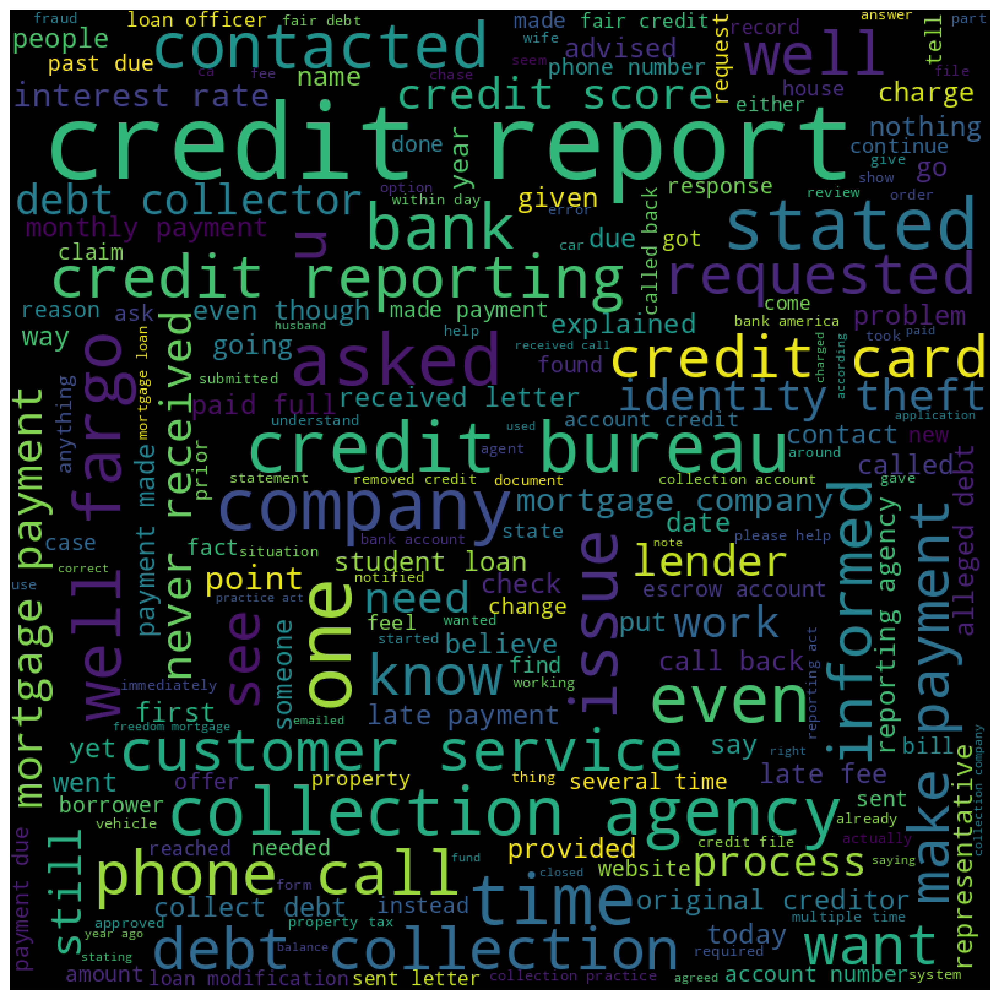

In [87]:
# Creating the Word Cloud
final_wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = STOPWORDS, 
                min_font_size = 10).generate(comment_words)

# Displaying the WordCloud                    
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(final_wordcloud) 
plt.axis("off")
plt.tight_layout(pad = 0) 
  
plt.show()

These wordcloud shows the most common terms found in complaints for Debt Collection.

In [15]:
model_DC = BERTopic(n_gram_range=(2, 3), nr_topics=53)
topics_DC, _ = model_DC.fit_transform(df_DC['narrative'])

In [16]:
model_DC.get_topic_freq().head()

,Topic,Count
0,-1,17753
1,0,1895
2,1,901
3,2,845
4,3,834


For Debt Collection, we generate around 53 topics with each topic being represented by an integer. The topic represented by -1 denotes outliers and we can ignore that topic while analyzing the other important topics. By plotting an intertopic distance map, we can visualize and see which topics consists of which keywords and how far apart they are when plotted in a 2-dimensional space. We can observe from the above table that 2225 complaints that are represented by topic 0 are most common for Debt Collection. Count for a topic represents the number of complaints that belong to the topic. We will take a further look at what kind of complaints are present in topic 0.

In [17]:
model_DC.visualize_topics()

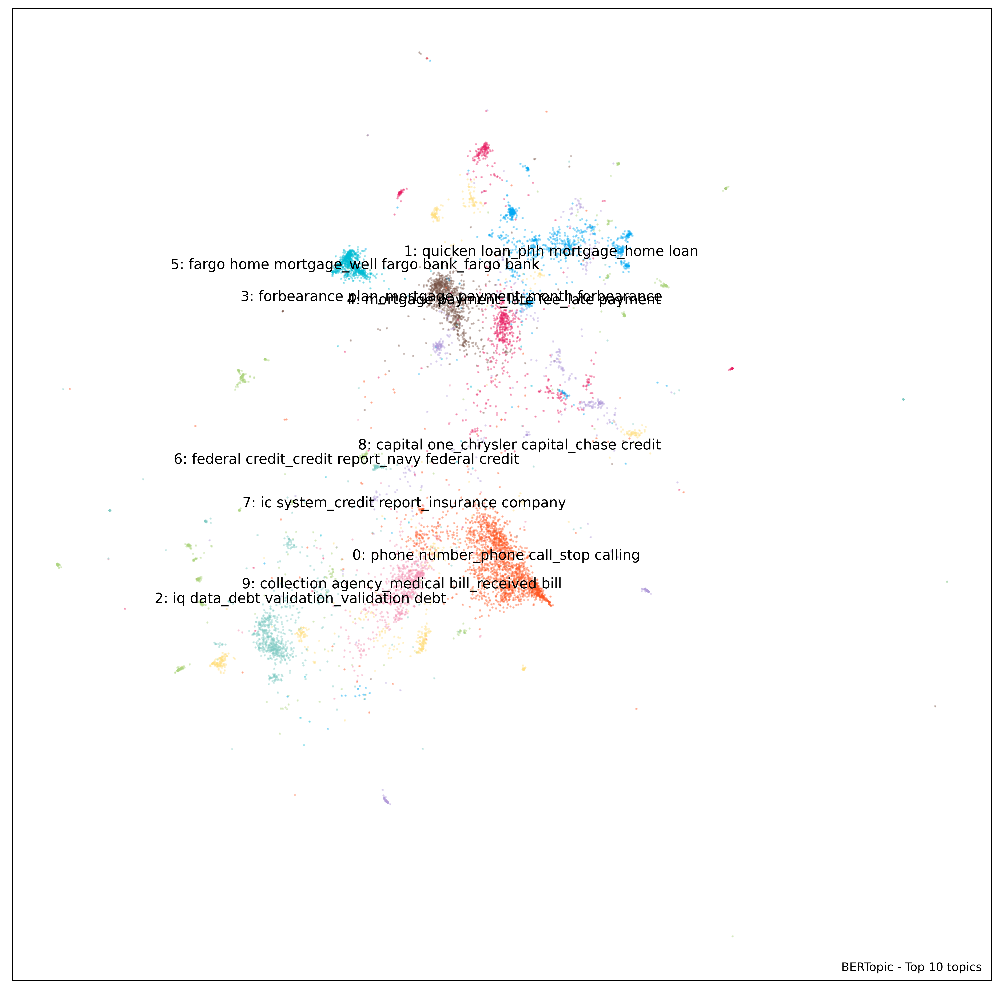

In [43]:
# Prepare data for plotting
embeddings = model_DC._extract_embeddings(df_DC['narrative'], method="document")
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit(embeddings)
df = pd.DataFrame(umap_model.embedding_, columns=["x", "y"])
df["topic"] = topics_DC

# Plot parameters
top_n = 10
fontsize = 12

# Slice data
to_plot = df.copy()
to_plot[df.topic >= top_n] = -1
outliers = to_plot.loc[to_plot.topic == -1]
non_outliers = to_plot.loc[to_plot.topic != -1]

# Visualize topics
cmap = matplotlib.colors.ListedColormap(['#FF5722', # Red
                                         '#03A9F4', # Blue
                                         '#4CAF50', # Green
                                         '#80CBC4', # FFEB3B
                                         '#673AB7', # Purple
                                         '#795548', # Brown
                                         '#E91E63', # Pink
                                         '#212121', # Black
                                         '#00BCD4', # Light Blue
                                         '#CDDC39', # Yellow/Red
                                         '#AED581', # Light Green
                                         '#FFE082', # Light Orange
                                         '#BCAAA4', # Light Brown
                                         '#B39DDB', # Light Purple
                                         '#F48FB1', # Light Pink
                                         ])

# Visualize outliers + inliers
fig, ax = plt.subplots(figsize=(15, 15))
# scatter_outliers = ax.scatter(outliers['x'], outliers['y'], c="#E0E0E0", s=1, alpha=.3)
scatter = ax.scatter(non_outliers['x'], non_outliers['y'], c=non_outliers['topic'], s=1, alpha=.3, cmap=cmap)

# Add topic names to clusters
centroids = to_plot.groupby("topic").mean().reset_index().iloc[1:]
for row in centroids.iterrows():
    topic = int(row[1].topic)
    text = f"{topic}: " + "_".join([x[0] for x in model_DC.get_topic(topic)[:3]])
    ax.text(row[1].x, row[1].y*1.01, text, fontsize=fontsize, horizontalalignment='center')

ax.text(0.99, 0.01, f"BERTopic - Top {top_n} topics", transform=ax.transAxes, horizontalalignment="right", color="black")
plt.xticks([], [])
plt.yticks([], [])
plt.show()

A static 2D visualization of the top 10 topics for Debt Collection is shown above.

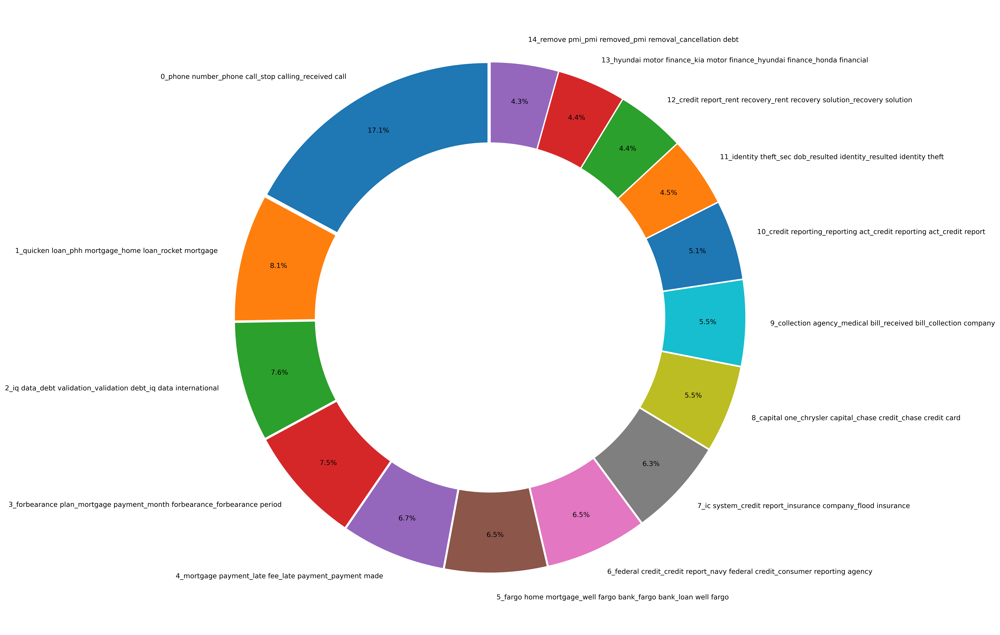

In [18]:
# Pie chart
labels = model_DC.get_topic_info()['Name'].values[1:16]
sizes = model_DC.get_topic_freq()['Count'].values[1:16]
#explsion
explode = [0.02]* len(sizes)
 
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
plt.show()

We plot a pie-chart for the top 15 topics for Debt Collection as well. *(Open the image in a new tab for better quality).* From the chart we observe that around **19.6%** of the complaints for Debt Collection are for issues with **phone numbers and phone calls**. It is followed by **mortgage payment** issues which makes up for around **10.7%** of the complaints. Similarly primary topics for other complaints can be seen (eg. Identity Theft, Wells Fargo, etc.)

For each of the topics we generated with BERTopic, we print out the primary keywords below.

In [19]:
topic_idxs = list(range(0, 53))
counts = model_DC.get_topic_freq()['Count'].values[1:]
for idx,count in zip(topic_idxs, counts):
    kws = model_DC.get_topic(idx)
    print(f"Topic: {idx}\t\t Counts: {count}")
    for kw in kws:
        print('\t', kw[0])
    print()
    print()

Topic: 0		 Counts: 1895
	 phone number
	 phone call
	 stop calling
	 received call
	 call back
	 call number
	 keep calling
	 number call
	 continue call
	 call work


Topic: 1		 Counts: 901
	 quicken loan
	 phh mortgage
	 home loan
	 rocket mortgage
	 loan officer
	 carrington mortgage
	 caliber home loan
	 mortgage loan
	 planet home lending
	 mortgage service


Topic: 2		 Counts: 845
	 iq data
	 debt validation
	 validation debt
	 iq data international
	 validation letter
	 validate debt
	 certified mail
	 verification debt
	 debt validation letter
	 via certified mail


Topic: 3		 Counts: 834
	 forbearance plan
	 mortgage payment
	 month forbearance
	 forbearance period
	 end loan
	 end forbearance
	 mortgage forbearance
	 loan forbearance
	 forbearance due
	 day forbearance


Topic: 4		 Counts: 738
	 mortgage payment
	 late fee
	 late payment
	 payment made
	 made payment
	 make payment
	 payment due
	 payment would
	 payment received
	 payment time


Topic: 5		 Counts: 722
	 farg

We put complaints belonging to the same topic in a list with each topic index as the key in a dictionary

In [ ]:
topic_docs_DC = {topic: [] for topic in set(topics_DC)}
for topic, doc in zip(topics_DC, df_DC['narrative']):
    topic_docs_DC[topic].append(doc)
    
topic_docs_DC

## Transaction Processing

In [ ]:
df_TP = df[df['product'] == 'Transaction Processing']
df_TP.reset_index(inplace=True)

In [89]:
comment_words = ""
for i in df_TP.narrative: 
    i = str(i) 
    separate = i.split() 
    for j in range(len(separate)): 
        separate[j] = separate[j].lower() 
      
    comment_words += " ".join(separate)+" "

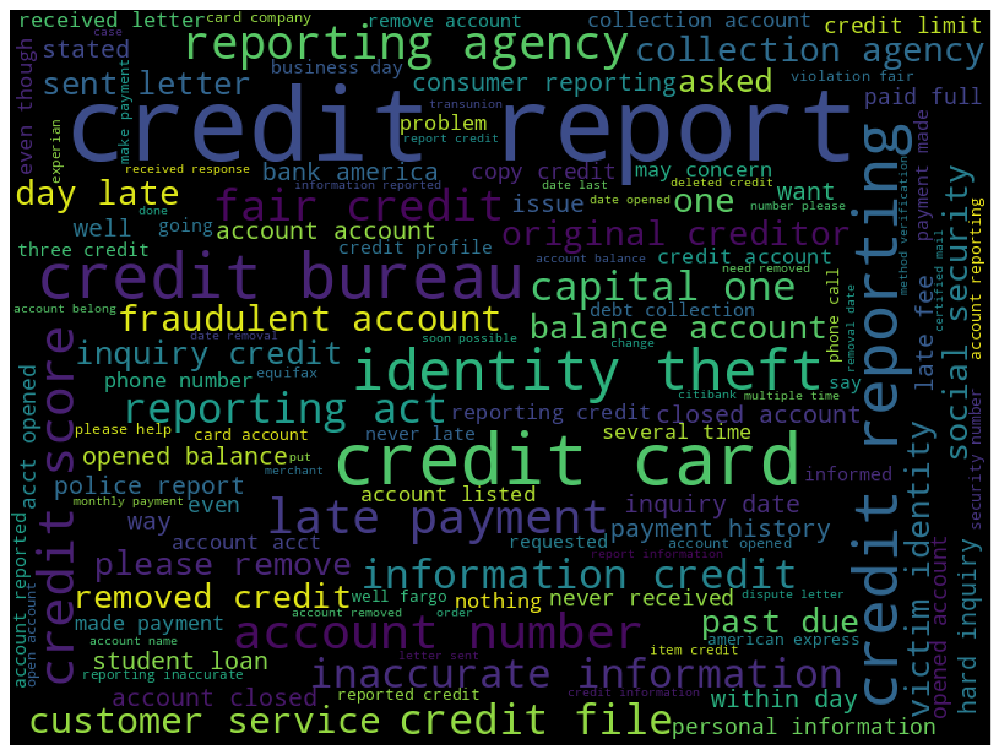

In [94]:
# Creating the Word Cloud
final_wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = STOPWORDS, 
                min_font_size = 10).generate(comment_words)

# Displaying the WordCloud                    
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(final_wordcloud) 
plt.axis("off")
plt.tight_layout(pad = 0) 
  
plt.show()

For complaints related to Transaction Processing, we see the most common terms associated with complaints from customers in this wordcloud.

In [21]:
model_TP = BERTopic(n_gram_range=(2, 3), nr_topics=86)
topics_TP, _ = model_TP.fit_transform(df_TP['narrative'])

In [22]:
model_TP.get_topic_freq()

,Topic,Count
0,-1,30986
1,0,1390
2,1,1189
3,2,889
4,3,887
...,...,...
82,81,226
83,82,226
84,83,224
85,84,221


For Transaction Processing, we generate around 86 topics with each topic being represented by an integer. The topic represented by -1 denotes outliers and we can ignore that topic while analyzing the other important topics. By plotting an intertopic distance map, we can visualize and see which topics consists of which keywords and how far apart they are when plotted in a 2-dimensional space. We can observe from the above table that 2277 complaints that are represented by topic 0 are most common for Transaction Processing. Count for a topic represents the number of complaints that belong to the topic. We will take a further look at what kind of complaints are present in topic 0.

In [23]:
model_TP.visualize_topics()

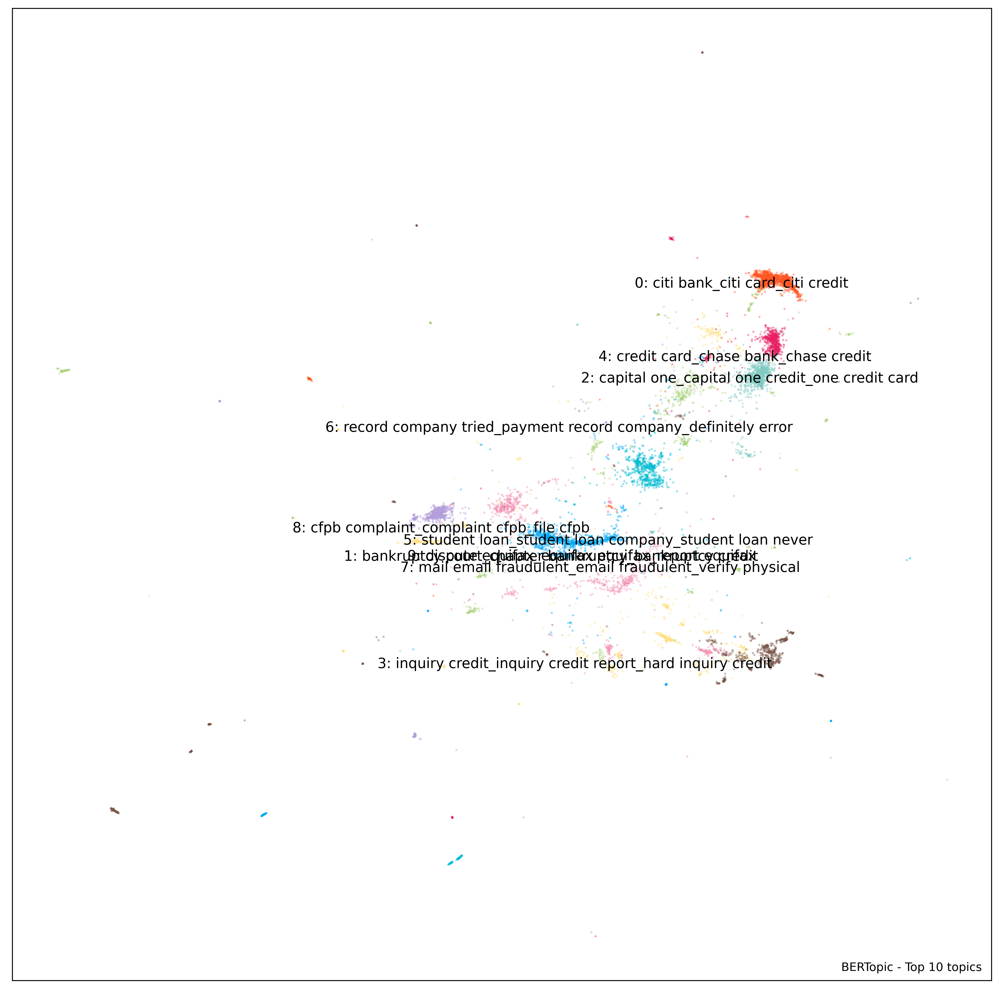

In [44]:
# Prepare data for plotting
embeddings = model_TP._extract_embeddings(df_TP['narrative'], method="document")
umap_model = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit(embeddings)
df = pd.DataFrame(umap_model.embedding_, columns=["x", "y"])
df["topic"] = topics_TP

# Plot parameters
top_n = 10
fontsize = 12

# Slice data
to_plot = df.copy()
to_plot[df.topic >= top_n] = -1
outliers = to_plot.loc[to_plot.topic == -1]
non_outliers = to_plot.loc[to_plot.topic != -1]

# Visualize topics
cmap = matplotlib.colors.ListedColormap(['#FF5722', # Red
                                         '#03A9F4', # Blue
                                         '#4CAF50', # Green
                                         '#80CBC4', # FFEB3B
                                         '#673AB7', # Purple
                                         '#795548', # Brown
                                         '#E91E63', # Pink
                                         '#212121', # Black
                                         '#00BCD4', # Light Blue
                                         '#CDDC39', # Yellow/Red
                                         '#AED581', # Light Green
                                         '#FFE082', # Light Orange
                                         '#BCAAA4', # Light Brown
                                         '#B39DDB', # Light Purple
                                         '#F48FB1', # Light Pink
                                         ])

# Visualize outliers + inliers
fig, ax = plt.subplots(figsize=(15, 15))
# scatter_outliers = ax.scatter(outliers['x'], outliers['y'], c="#E0E0E0", s=1, alpha=.3)
scatter = ax.scatter(non_outliers['x'], non_outliers['y'], c=non_outliers['topic'], s=1, alpha=.3, cmap=cmap)

# Add topic names to clusters
centroids = to_plot.groupby("topic").mean().reset_index().iloc[1:]
for row in centroids.iterrows():
    topic = int(row[1].topic)
    text = f"{topic}: " + "_".join([x[0] for x in model_TP.get_topic(topic)[:3]])
    ax.text(row[1].x, row[1].y*1.01, text, fontsize=fontsize, horizontalalignment='center')

ax.text(0.99, 0.01, f"BERTopic - Top {top_n} topics", transform=ax.transAxes, horizontalalignment="right", color="black")
plt.xticks([], [])
plt.yticks([], [])
plt.show()

A static 2D visualization of the top 10 topics for Transaction Processing is shown above.

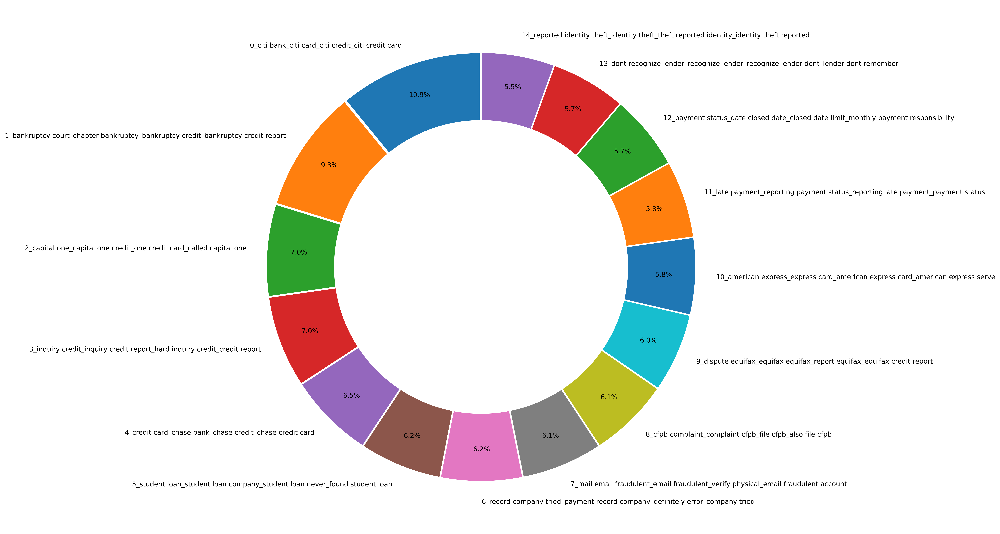

In [24]:
# Pie chart
labels = model_TP.get_topic_info()['Name'].values[1:16]
sizes = model_TP.get_topic_freq()['Count'].values[1:16]
#explsion
explode = [0.02]* len(sizes)
 
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
plt.show()

For the top 15 topics in Transaction Processing, we can observe a pie chart above. (Open the image in a new tab for better quality). From the chart we see that around **16.9%** of the complaints for Debt Collection are regarding **citi bank credit cards**. It is followed by **bankruptcy** issues which makes up for around **7.6%** of the complaints. Similarly primary topics for other complaints can be seen (eg. Late Payment, Bank of America, etc.)

For each of the generated topics, we print out the keywords for the topics.

In [25]:
topic_idxs = list(range(0, 86))
counts = model_TP.get_topic_freq()['Count'].values[1:]
for idx,count in zip(topic_idxs, counts):
    kws = model_TP.get_topic(idx)
    print(f"Topic: {idx}\t\t Counts: {count}")
    for kw in kws:
        print('\t', kw[0])
    print()
    print()

Topic: 0		 Counts: 1390
	 citi bank
	 citi card
	 citi credit
	 citi credit card
	 contacted citi
	 citibank credit
	 citibank credit card
	 card citi
	 dispute citi
	 call citi


Topic: 1		 Counts: 1189
	 bankruptcy court
	 chapter bankruptcy
	 bankruptcy credit
	 bankruptcy credit report
	 bankruptcy account
	 included bankruptcy
	 filed bankruptcy
	 letter bankruptcy
	 two bankruptcy
	 verified bankruptcy


Topic: 2		 Counts: 889
	 capital one
	 capital one credit
	 one credit card
	 called capital one
	 card capital one
	 contacted capital one
	 capital one account
	 capital one card
	 capital one bank
	 payment capital one


Topic: 3		 Counts: 887
	 inquiry credit
	 inquiry credit report
	 hard inquiry credit
	 credit report
	 therefore inquiry credit
	 view credit
	 organization view credit
	 view credit history
	 act section transaction
	 violates fair credit


Topic: 4		 Counts: 830
	 credit card
	 chase bank
	 chase credit
	 chase credit card
	 apple card
	 chase card
	 chase 

We put complaints belonging to the same topic in a list with each topic index as the key in a dictionary

In [ ]:
topic_docs_TP = {topic: [] for topic in set(topics_TP)}
for topic, doc in zip(topics_TP, df_TP['narrative']):
    topic_docs_TP[topic].append(doc)
    
topic_docs_TP

## Saving the BERTopic Models

In [ ]:
model_RB.save("model_RB")
model_DC.save("model_DC")
model_TP.save("model_TP")

## Loading the BERTopic Models

In [ ]:
model_RB = BERTopic.load("model_RB")
model_DC = BERTopic.load("model_DC")
model_TP = BERTopic.load("model_TP")

## Saving the BERTopic Topic Docs

In [ ]:
joblib.dump(topic_docs_RB, 'topic_docs_RB.joblib')
joblib.dump(topic_docs_DC, 'topic_docs_DC.joblib')
joblib.dump(topic_docs_TP, 'topic_docs_TP.joblib')

## Loading the BERTopic Topic Docs

In [ ]:
topic_docs_RB = joblib.load('topic_docs_RB.joblib')
topic_docs_DC = joblib.load('topic_docs_DC.joblib')
topic_docs_TP = joblib.load('topic_docs_TP.joblib')